# Assignment 5: Graphs and Trees

*If something in the assignment is unclear or does not make sense, make a note and ask the lecturer, a TA in the exercise session, or a friend!*

### Homework Exercises

Solutions to the following exercises are to be handed in, either typed or handwritten. Write neatly and concisely, so the solutions are easy to read. You are allowed (even encouraged) to work in groups, but solutions have to be written and handed in individually. If you worked in groups, please state on your answer sheet who you worked with. 


1. (EG 6.4, 6.5, 6.6)
    * Consider the following statement, which we shall call the "Sum of Degrees" lemma: given an undirected graph $G$, the sum of the degrees is always an even number. Prove this statement.
        *Hint*: All the edges have two ends.
    
    * Using the "Sum of Degrees" lemma, prove the well-known *Hand-Shaking Lemma*: in every undirected graph, the number of vertices that touch an odd number of edges is even.

    * The name of the lemma comes from the analogy that, during a cocktail party where it will always be an even number of guests that have shaken hands an odd number of times. Model this situation using a graph and argue that the hand-shaking lemma implies this fact. What do the nodes in the cocktail party graph represent? And the edges?

    * Reprove the hand-shaking lemma, this time by induction on the number of edges.
        *Hint*: For every edge, there are three cases. Either both endpoints have even degree, or both have odd degree, or one has even degree and the other has odd degree. What will happen with the number of nodes of odd degree in each of these cases?

2. (EG 6.61) Consider the following lemma: For every tree $T = (V, E)$ with $|V| \geq 1$, it holds that $|V| = |E| + 1$.

    * Draw a couple of trees and count the number of edges and vertices, to verify that the previous identity holds in those examples. If you need inspiration, google some examples of trees.

    * Prove by induction on the number of nodes $|V|$ that the lemma holds.
        *Hint*: The base case is the tree with one node and no edges. For the inductive case, note that a tree with at least two nodes must have at least two leaves; what would happen if we removed one of those leaves and the edge leading to it?

    * __Tricky bonus question:__ In fact, the converse is also true for all connected graphs: if $G = (V, E)$ is a connected undirected graph, $|V| \geq 1$ and $|V| = |E| + 1$, then $G$ is actually a tree. Prove this.
        *Hint*: Argue using induction on the number of vertices that if $G$ is connected, then $|E| \geq |V| - 1$. Conclude that if $G$ is connected and $|E| = |V| - 1$, removing an edge would immediately disconnect the graph.  On the other hand, if there is a cycle in the graph, what would happen if we removed an edge from it? Would the graph become disconnected?



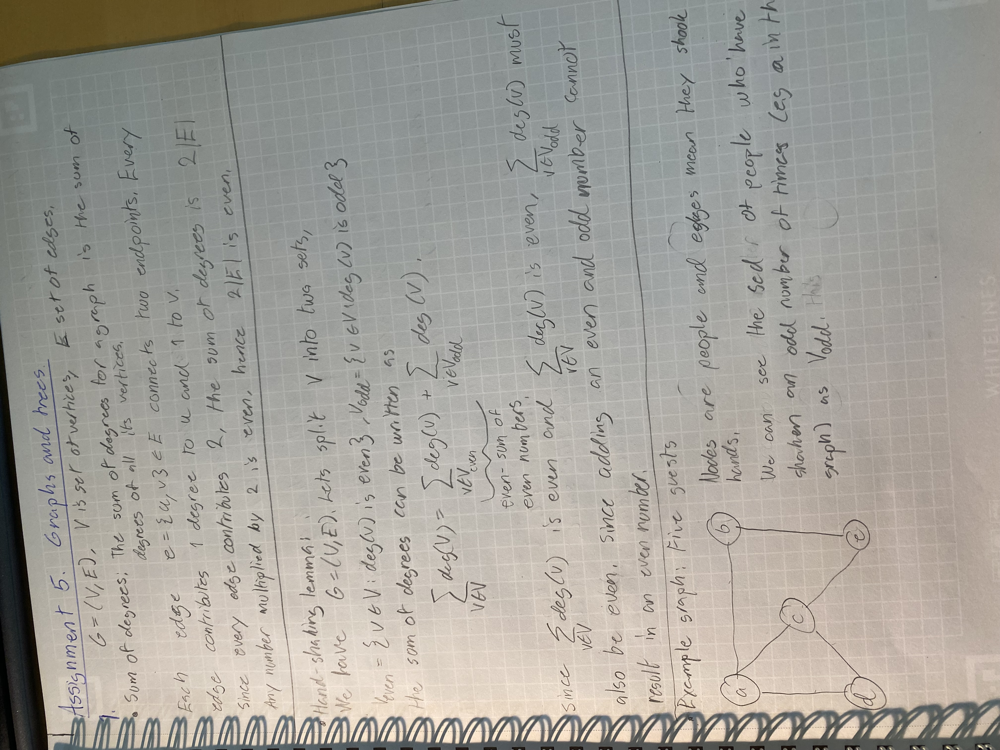

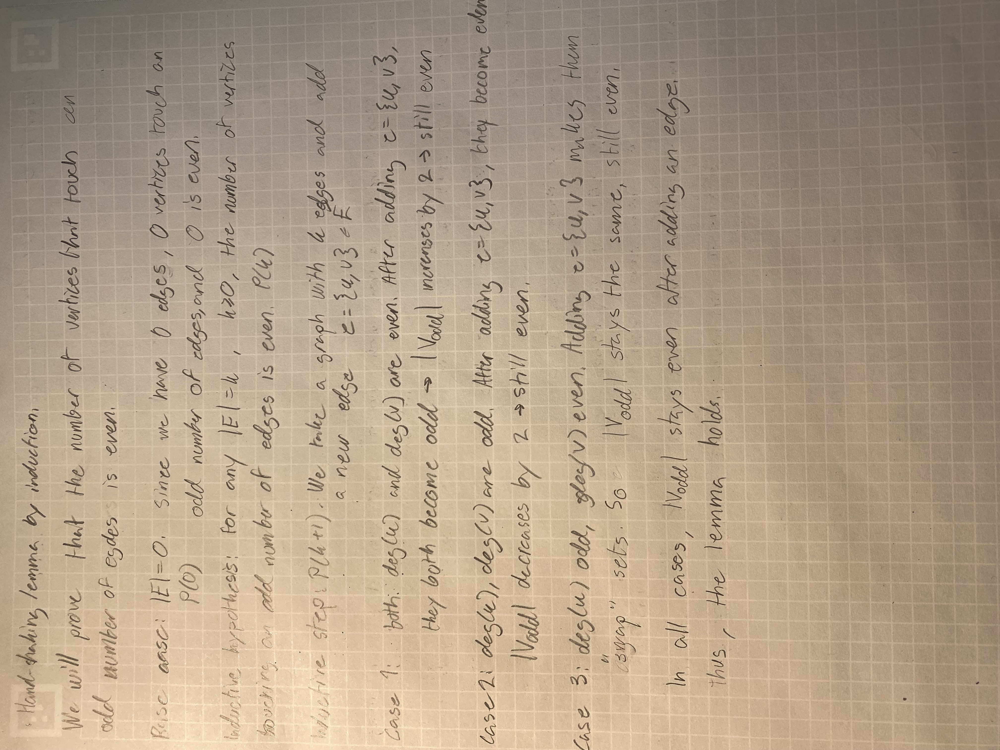

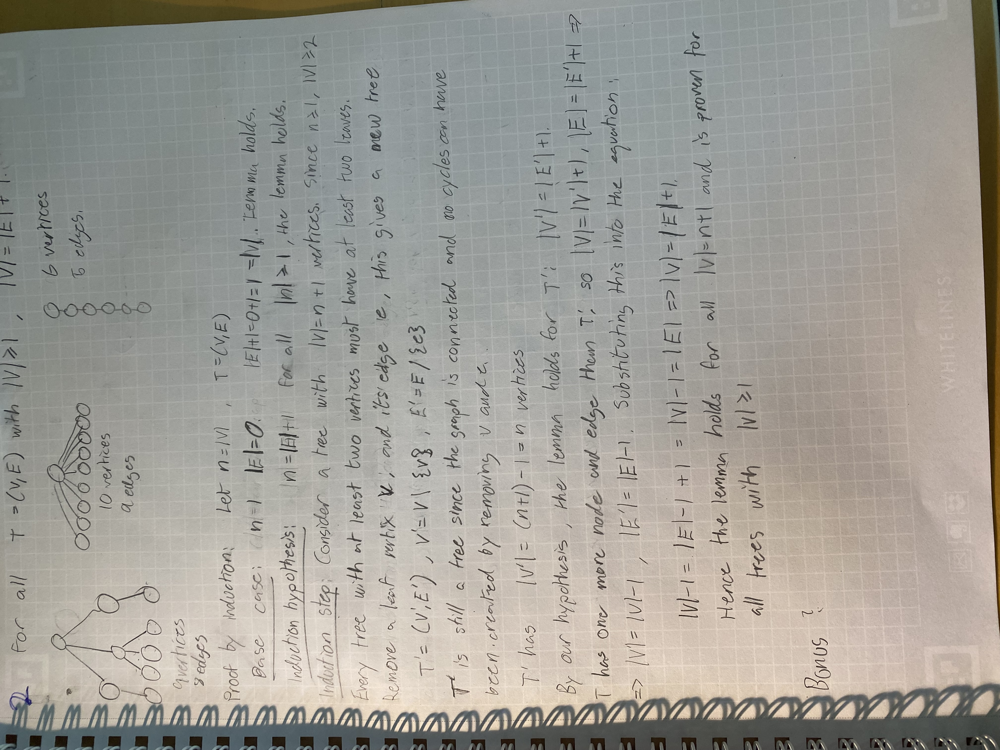

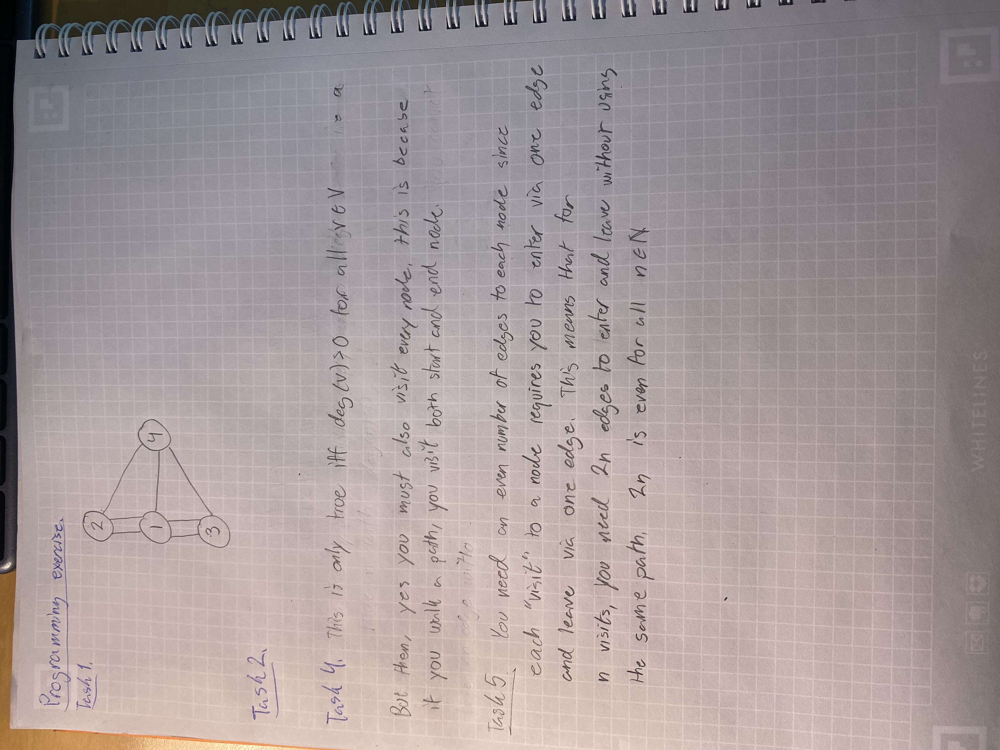

In [100]:
from IPython.display import Image, display

display(Image(filename='IMG_6336.jpeg'))
display(Image(filename='IMG_6337.jpeg'))
display(Image(filename='IMG_6338.jpeg'))
display(Image(filename='IMG_6339.jpeg'))

### Programming Exercise

In this programming exercise, we will explore a famous theorem of Leonhard Euler that kickstarted the study of graph theory as we know it today. The problem is motivated by the well-known problem of the seven bridges of Königsberg. The story goes that the city had its neighborhoods divided in four areas, which were connected by bridges according to the picture below.

<img src="bridges1.png" alt="drawing" width="600"/>

It is said that the people of Königsberg would go for walks, starting and finishing at the same area, trying to see if they could cross each bridge exactly once and come back to the place they started at. Sadly, nobody seemed to succeed in this, despite the many variations that they tried.

Euler's observation is that the map of Königsberg could be simplified into a *graph*: edges would be bridges between nodes that would represent the four areas of the city.

**Task 1:** Draw a graph with four nodes and seven edges that captures the bridges of the map of Königsberg, like Euler did.

Did you notice something funny? Technically speaking, this graph has repeated edges! This is because to go from the middle neighborhood of the city to the top one, we can take two different bridges. This is technically not allowed in our usual definition of graphs. When we allow this other situation, we say that we have a *multigraph*.

When encoding a multigraph, we can no longer encode the edge relation as a set $E \subseteq V \times V$, because by definition, sets can only contain one copy of the same element. Hence, it is more convenient to use something like a *list*. While the list $\mathsf{[1, 2, 2, 3]}$ has two copies of 2, as a set this would become $\mathsf{\{ 1, 2, 3 \}}$. Luckily for us, in Python the most convenient data structure for collections of objects is precisely the *list*, so we are all good.

**Task 2:** Suppose we call the four neighborhoods of Königsberg $1, 2, 3, 4$, where 1 corresponds to the central island, 2 and 3 are respectively the North and South parts, and 4 is the Eastern mass of land. Define in Python a list containing the ordered pairs of the edges that are present in the graph above. Below you can see an example. We will adopt the following convention: since the graph is undirected, when adding an edge from $i$ to $j$, we always add the pair $(i, j )$ for $i < j$ and *not* $(j, i)$, although we will assume that $(j, i)$ is also implicit; and if there are multiple copies of the same edge, we will add it multiple times.

In [101]:
# An example multigraph with 4 nodes and one repeated edge.
example_graph = [(1, 2), (1, 3), (1, 4), (2, 4), (3, 4), (3, 4)]

# The graph corresponding to the seven bridges of Königsberg.
konigsberg = [(1, 2), (1, 2), (1, 3), (1, 3), (1, 4), (2, 4), (3, 4)]  # to do

Graphs can be represented in many ways. The way we just used considered directly writing all the edges explicitly in a list. How would you check whether two nodes are adjacent using this definition?

**Task 3** : Write a function in Python that takes as input a graph $G$ written in the list format above, together with the indices $i$ and $j$ of two nodes, and checks whether there is an edge between them.

In [102]:
def adjacent_list(G, v, w):
    return (v, w) in G


print(adjacent_list(example_graph, 1, 3))
print(adjacent_list(example_graph, 1, 2))
print(adjacent_list(example_graph, 2, 3))
print(adjacent_list(example_graph, 3, 4))

# The cases should output True, True, False, True


True
True
False
True


The way the citizens of Königsberg looked for this special walks was rather rudimentary! They just tried all the possible combinations of paths. A path of the kind they were after is now called an *Eulerian tour*: a cycle that uses every edge exactly once.

**Task 4**: By definition, in an Eulerian tour all edges must be used. Argue that if you have an Eulerian tour, then the cycle actually involves all the *nodes* in the graph too.

What Euler observed is that, in fact, in order to have an Eulerian tour, the degree of every node must be even.

**Task 5**: Prove **Euler's tours theorem**: in a graph $G$, there exists an Eulerian tour (a cycle using every edge in the graph exactly once) if and only if the graph is connected and all nodes have even degree.

We will now write a piece of code that can perform this check for us. Before we do that, we will convert our graphs into a more readable format of *adjacency matrices*. In a graph $G$ of $n$ nodes, the adjacency matrix of $G$, denoted $A_G$, is a $n \times n$ matrix where we write a $1$ if $i$ and $j$ are adjacent (there is an edge between them), and zero otherwise. In the case of multigraphs, the entry $(i, j)$ in the matrix contains the exact number of edges between these two nodes.

*Note:* Because our graphs are undirected, the entries $(i, j)$ and $(j, i)$ should be the same.

**Task 6:** Write a function $\mathsf{list\_to\_matrix}$ that takes a graph in the list format above and its number of nodes, and outputs the adjacency matrix. The latter is encoded as a list of lists in Python.

*Note*: We are indexing $n$ vertices with numbers $1$ to $n$, but Python indices work from $0$ to $n-1$. Take this into account when writing your code!

In [103]:
def list_to_matrix(G, n):
    
    res = [[0]*n for _ in range(n)]

    for edge in G:
        i = edge[0] - 1 
        j = edge[1] - 1
        res[i][j] += 1
        res[j][i] += 1
    
    return res


print(list_to_matrix(konigsberg, 4))

[[0, 2, 2, 1], [2, 0, 0, 1], [2, 0, 0, 1], [1, 1, 1, 0]]


Let's make sure that the matrices we get are looking good.

**Task 7**: Write a Python function that given an adjacency matrix, outputs a list with the elements in the diagonal.

In [104]:
def diag(A):
    return [A[i][i] for i in range(len(A))]

print(diag(list_to_matrix(konigsberg, 4)))

[0, 0, 0, 0]


Did you get the all zeroes list?

**Task 8**: Explain why you got the all-zeroes list. Does this make sense? What kind of edges would we have to have in order to find non-zero entries in the diagonals? Because the diagonal describes the nodes to themselves. To have a 0 here we would need a node to have an edge to itself.

**Task 9**: Write a function that checks the degree of a node in a graph, given its adjacency matrix.

In [105]:
def degree(G, v):
    return sum(G[v-1])

print(degree(list_to_matrix(konigsberg, 4), 4))

3


**Task 10**: Write a Python function that checks that a graph encoded as an adjacency matrix is an Eulerian tour. Conclude using your algorithm that the graph of Königsberg does not contain an Eulerian tour.

In [106]:
def eulerian_tour(A):
    return not any(degree(A, i + 1) % 2 != 0 for i in range(len(A)))


print(eulerian_tour(list_to_matrix(konigsberg, 4)))

False


Euler's work was presented to the St. Petersburg Academy of Science on August of 1735 and is considered the first proper theorem of graph theory. Euler's key insight that what mattered was the number of bridges and the list of their endpoints (rather than their exact positions) presaged the development of *topology*: the difference between the actual layout and the graph schematic is a good example of the idea that topology is not concerned with the rigid shape of objects.

Hence, as Euler recognized, the "geometry of position" is not about "measurements and calculations" but about something more general. That called in question the traditional Aristotelian view that mathematics is the "science of quantity". Though that view fits arithmetic and Euclidean geometry or calculus, it did not fit topology and the more abstract structural features studied in modern mathematics.

During the Second World War, the city of Königsberg (now Kaliningrad, Russia), was heavily bombed and two of the seven bridges were destroyed and never rebuilt. The new map looks as follows; in red and with a square, the missing bridges, and in green and with a circle the present ones.

![alt text](bridges2.jpeg)

Indeed, Euler's modelling and solution to the problem is so general and elegant that the exact *physical* details of the bridges do not matter, and the solution can be easily adapted to the updated setting.

**Task 11**: Write the graph corresponding to the post-war map of Königsberg and check with your function whether it has a Eulerian tour. If so, can you find an explicit such tour? What happens if we relax the condition for a tour and ask simply for a *path* that uses all the edges, but that could possibly start and end at different points?


In [107]:
post_war = [(1, 2), (1, 3), (1, 4), (2, 4), (3, 4)]
print(list_to_matrix(post_war, 4))
print(eulerian_tour(list_to_matrix(post_war, 4)))

[[0, 1, 1, 1], [1, 0, 0, 1], [1, 0, 0, 1], [1, 1, 1, 0]]
False
